**Deep Learning - Trabalho Conclusão de Módulo**

> 27/04/2024




**Integrantes**

- André Luiz Pires Guimarães
- Daniel de Souza Miranda
- Iago Nery Mendes
- Lucas Elias de Andrade Cruvinel
- Victor Hugo Brito da Silva Miranda

In [63]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import uuid
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error

In [64]:
df_milk = pd.read_csv("milk.csv", parse_dates=["Date"])
df_milk.dropna(how='any', axis=0, inplace=True, ignore_index=True)
df_milk.shape

(25846, 10)

In [65]:
# Nome da coluna que deseja mover para a última posição
coluna = 'milk_production'

# Remover a coluna do DataFrame
coluna_removida = df_milk.pop(coluna)

# Inserir a coluna removida na última posição
df_milk.insert(len(df_milk.columns), coluna, coluna_removida)

In [66]:
df_milk.head()

,AnEar,Date,lactation,dim,MilkShif,Cond,Dur,Peak,dim2,milk_production
0,123,2023-01-09,4,1,11.50,5.420,276.0,6.7,1,11.5
1,123,2023-01-10,4,2,24.20,4.945,384.0,15.0,2,48.4
2,123,2023-01-11,4,3,33.20,5.060,672.0,15.5,3,66.4
3,123,2023-01-12,4,4,28.55,4.940,354.0,16.4,4,57.1
4,123,2023-01-13,4,5,39.25,5.055,396.0,17.0,5,78.5


In [67]:
df_milk.tail()

,AnEar,Date,lactation,dim,MilkShif,Cond,Dur,Peak,dim2,milk_production
25841,9977,2023-12-13,2,301,36.40,4.980,540.0,13.8,301,72.8
25842,9977,2023-12-14,2,302,36.50,4.700,600.0,12.9,302,73.0
25843,9977,2023-12-15,2,303,35.45,5.075,540.0,13.3,303,70.9
25844,9977,2023-12-16,2,304,35.30,4.955,516.0,12.0,304,70.6
25845,9977,2023-12-17,2,305,33.85,4.960,522.0,12.3,305,67.7


In [68]:
df_milk['AnEar'].value_counts()

AnEar
123     305
8947    305
9066    305
9078    305
9081    305
       ... 
9525    304
9549    304
8064    304
7761    301
8732    259
Name: count, Length: 85, dtype: int64

In [69]:
#Definindo as variáveis para o heatmap
variaveis = ['AnEar', 'lactation', 'dim', 'MilkShif', 'Cond', 'Dur', 'Peak', 'dim2', 'milk_production']

**Gráfico de Dispersão**

Gráfico de dispersão para cada variável em relação à milk_production, com uma linha de regressão linear ajustada aos dados. Isso pode ajudá-lo a visualizar a relação entre cada variável e o alvo.

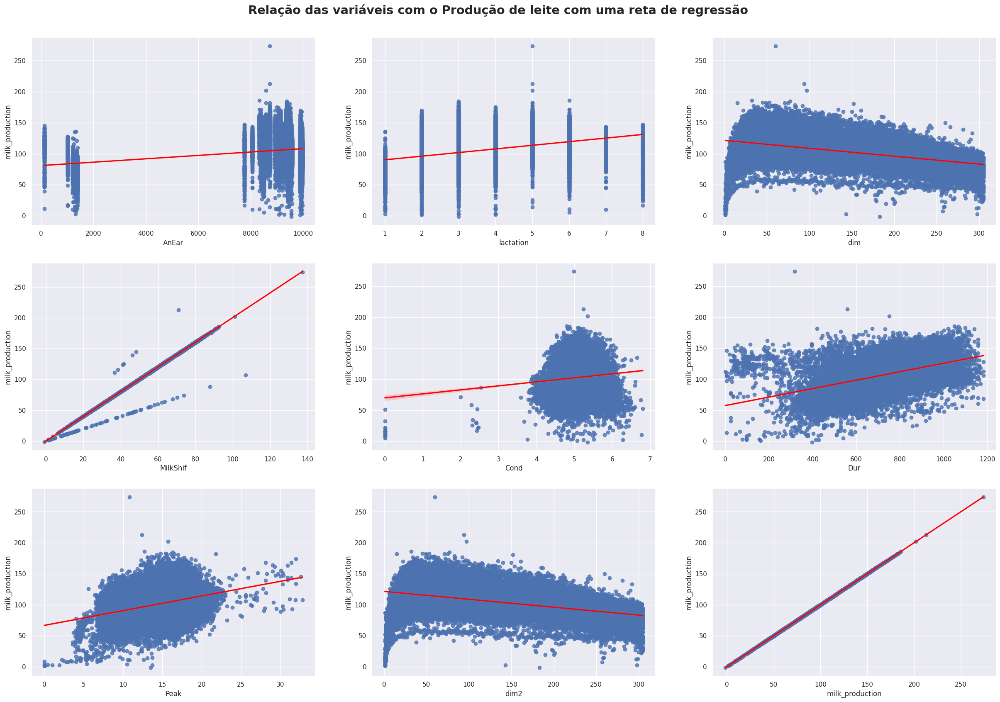

In [71]:
fig, ax = plt.subplots(np.ceil(len(variaveis)/4).astype('int8'), 3, figsize=(30,20))
i=0
for col in variaveis:
    sns.regplot(
        df_milk,
        x=df_milk[col],
        y=df_milk['milk_production'],
        ax=ax[int(i/3),i%3],
        line_kws={'color': 'red'}  # Alterando a cor da linha de regressão para vermelho
        )
    i+=1

plt.suptitle(
    'Relação das variáveis com o Produção de leite com uma reta de regressão',
    size='xx-large',
    weight='bold',
    y=0.92
    )
plt.show()

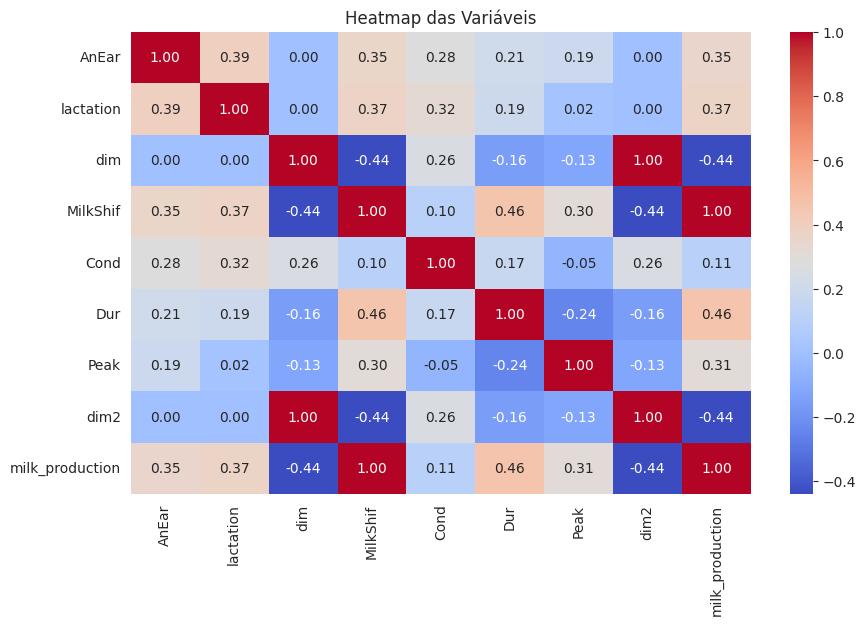

In [10]:
#Criando o heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(df_milk[variaveis].corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Heatmap das Variáveis')
plt.show() 

Text(0.5, 1.0, 'Produção de Leite')

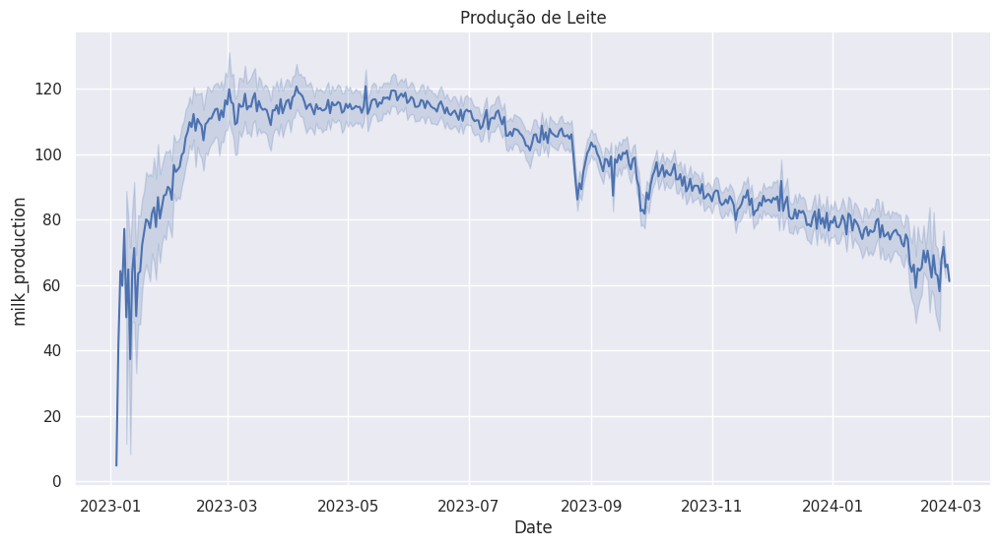

In [11]:
sns.set(style="darkgrid")
plt.figure(figsize=(12,6))
sns.lineplot(x=df_milk["Date"], y="milk_production", data=df_milk).set_title("Produção de Leite")

Armotizando a visualização:

<Axes: xlabel='Date'>

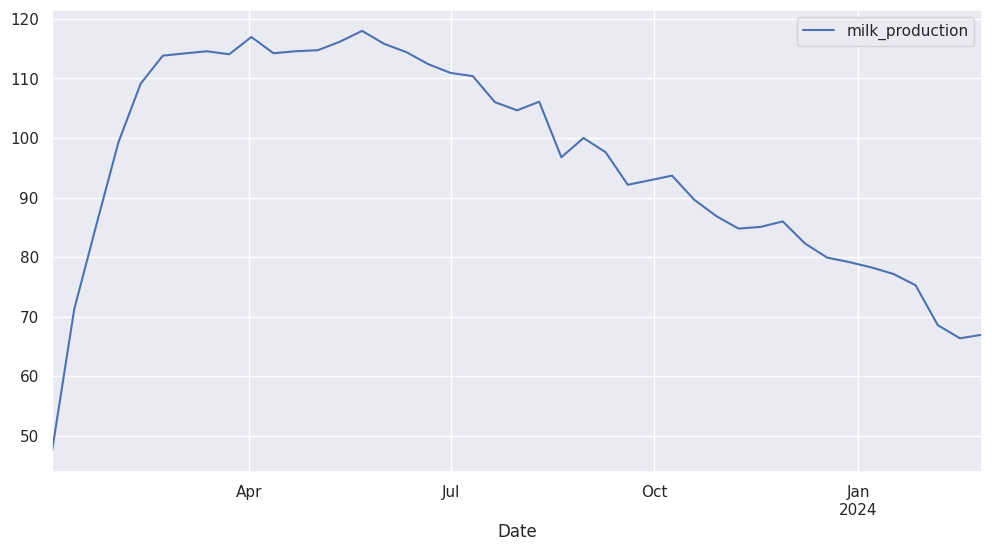

In [12]:
df_milk_am = pd.read_csv("RecurrentNeuralNetwork/milk.csv", parse_dates=["Date"])[["milk_production", "Date"]]
df_milk_am.set_index("Date", inplace=True)
df_milk_am.resample('10D').mean().plot(figsize=(12,6))

In [13]:
df_milk_copy = df_milk.copy()

# Estratégia 1 de Pré-processamento

Esta estratégia busca verificar se apenas as colunas _Lactation_, _Dim_ e _MilkShift_ são os dados mais representativos para treinar o modelo, e o mesmo conseguir fazer as predições de forma mais assertiva.

In [14]:
#df_milk.drop('AnEar'#df_milk., axis=1, inplace=True)
df_milk.drop('Date', axis=1, inplace=True)
df_milk.drop('Cond', axis=1, inplace=True)
df_milk.drop('Dur', axis=1, inplace=True)
df_milk.drop('Peak', axis=1, inplace=True)
df_milk.drop('dim2', axis=1, inplace=True)

In [15]:
df_milk.head()

,AnEar,lactation,dim,MilkShif,milk_production
0,123,4,1,11.50,11.5
1,123,4,2,24.20,48.4
2,123,4,3,33.20,66.4
3,123,4,4,28.55,57.1
4,123,4,5,39.25,78.5


Verificando a frequência da lactação

In [16]:
# Agrupar os dados pela combinação única de valores nas colunas 'AnEar' e 'lactation'
agrupado = df_milk_copy.groupby(['AnEar', 'lactation']).size().reset_index(name='count')
print(agrupado)

# Contar o número de vacas únicas para cada valor de lactation
frequencia = agrupado.groupby('lactation')['AnEar'].count()

# Exibir a frequência de vacas únicas com base no número de lactation
print("Frequência de vacas únicas com base no número de lactation:")
print((frequencia))


    AnEar  lactation  count
0     123          4    305
1    1009          2    305
2    1017          2    305
3    1209          1    305
4    1218          1    305
..    ...        ...    ...
80   9951          2    305
81   9961          2    305
82   9967          2    305
83   9968          2    304
84   9977          2    305

[85 rows x 3 columns]
Frequência de vacas únicas com base no número de lactation:
lactation
1    14
2    26
3    16
4    15
5     5
6     7
7     1
8     1
Name: AnEar, dtype: int64


In [17]:
codigos_vacas = np.array(df_milk_copy["AnEar"].unique())
print(codigos_vacas)

[ 123 1009 1017 1209 1218 1242 1243 1275 1280 1305 1327 1329 1341 1362
 1368 1387 1393 7761 8064 8334 8385 8393 8434 8435 8438 8509 8581 8667
 8723 8732 8741 8932 8947 8996 9005 9066 9069 9078 9081 9090 9101 9149
 9188 9207 9284 9346 9363 9388 9389 9431 9463 9464 9478 9487 9488 9525
 9529 9549 9558 9562 9583 9885 9891 9892 9894 9908 9909 9910 9917 9918
 9920 9922 9926 9928 9929 9933 9939 9943 9944 9946 9951 9961 9967 9968
 9977]


In [18]:
#train = []
#validation = []
#test = []

In [19]:
df_milk[(df_milk['lactation'] == 4) & (df_milk['AnEar'] == 123)]

,AnEar,lactation,dim,MilkShif,milk_production
0,123,4,1,11.50,11.5
1,123,4,2,24.20,48.4
2,123,4,3,33.20,66.4
3,123,4,4,28.55,57.1
4,123,4,5,39.25,78.5
...,...,...,...,...,...
300,123,4,301,24.65,49.3
301,123,4,302,23.00,46.0
302,123,4,303,24.80,49.6
303,123,4,304,23.30,46.6


In [20]:
#for i in range(len(frequencia)):
#    #dados_vaca = df_milk.loc[((df_milk['lactation'] == i))]
#    # Dividir as vacas do grupo atual em treinamento, validação e teste
#    df_temp = df_milk[df_milk['lactation'] == i+1]
#    vacas_treinamento, vacas_temp = train_test_split(df_temp, train_size=0.6, random_state=42)
#    vacas_validacao, vacas_teste = train_test_split(vacas_temp, train_size=0.5, random_state=42)
#    for i in range(len(vacas_treinamento)):
#        train.append(vacas_treinamento)
#    for j in range(len(vacas_validacao)):
#        validation.append(vacas_validacao)
#        test.append(vacas_teste)
#print(len(train))
#print(len(validation))
#print(len(test))
#print(len(train) + len(validation) + len(test))

In [21]:
teste_anear = df_milk[(df_milk['lactation'] == 4) & (df_milk['AnEar'] == 123)]
teste_anear

,AnEar,lactation,dim,MilkShif,milk_production
0,123,4,1,11.50,11.5
1,123,4,2,24.20,48.4
2,123,4,3,33.20,66.4
3,123,4,4,28.55,57.1
4,123,4,5,39.25,78.5
...,...,...,...,...,...
300,123,4,301,24.65,49.3
301,123,4,302,23.00,46.0
302,123,4,303,24.80,49.6
303,123,4,304,23.30,46.6


# Estratégia 2 de Pré-processamento

Esta estratégia busca verificar se a coluna adiocinal _Dur_ tem maior efeito em conjunto com as colunas _Lactation_, _Dim_ e _MilkShift_ para treinamento do modelo, e o mesmo conseguir fazer as predições de forma mais assertiva.

In [22]:
df_milk_E2 = df_milk_copy

In [23]:
#df_milk.drop('AnEar'#df_milk., axis=1, inplace=True)
df_milk_E2.drop('Date', axis=1, inplace=True)
df_milk_E2.drop('Cond', axis=1, inplace=True)
df_milk_E2.drop('Peak', axis=1, inplace=True)
df_milk_E2.drop('dim2', axis=1, inplace=True)

In [24]:
df_milk_E2.head()

,AnEar,lactation,dim,MilkShif,Dur,milk_production
0,123,4,1,11.50,276.0,11.5
1,123,4,2,24.20,384.0,48.4
2,123,4,3,33.20,672.0,66.4
3,123,4,4,28.55,354.0,57.1
4,123,4,5,39.25,396.0,78.5


In [25]:
df_milk_E2[(df_milk_E2['lactation'] == 4) & (df_milk_E2['AnEar'] == 123)]

,AnEar,lactation,dim,MilkShif,Dur,milk_production
0,123,4,1,11.50,276.0,11.5
1,123,4,2,24.20,384.0,48.4
2,123,4,3,33.20,672.0,66.4
3,123,4,4,28.55,354.0,57.1
4,123,4,5,39.25,396.0,78.5
...,...,...,...,...,...,...
300,123,4,301,24.65,348.0,49.3
301,123,4,302,23.00,414.0,46.0
302,123,4,303,24.80,378.0,49.6
303,123,4,304,23.30,408.0,46.6


In [26]:
teste_anear_E2 = df_milk_E2[(df_milk_E2['lactation'] == 4) & (df_milk_E2['AnEar'] == 123)]
teste_anear_E2

,AnEar,lactation,dim,MilkShif,Dur,milk_production
0,123,4,1,11.50,276.0,11.5
1,123,4,2,24.20,384.0,48.4
2,123,4,3,33.20,672.0,66.4
3,123,4,4,28.55,354.0,57.1
4,123,4,5,39.25,396.0,78.5
...,...,...,...,...,...,...
300,123,4,301,24.65,348.0,49.3
301,123,4,302,23.00,414.0,46.0
302,123,4,303,24.80,378.0,49.6
303,123,4,304,23.30,408.0,46.6


# Separação de vacas

Lógica utilizada atualmente

In [41]:
def janelas_da_vaca_2(df, nome_vaca, tam):
    tam_train = int(tam * 0.7)
    janelas_train = []
    janelas_val = []
    janelas_test = []
    num_cols = len(df.columns)
    input_vaca = df[df["AnEar"]==nome_vaca].to_numpy()
    target_vaca = df[df["AnEar"]==nome_vaca]["milk_production"].to_numpy()
    for i in range(tam_train):
        janelas_train.append([input_vaca[i][1:num_cols-1], [target_vaca[i]]])
    for j in range(tam_train, tam+1, 1):
        janelas_val.append([input_vaca[j-1][1:num_cols-1], [target_vaca[j-1]]])
    for k in range(tam+1, len(input_vaca)+1, 1):
        janelas_test.append([input_vaca[k-1][1:num_cols-1], [target_vaca[k-1]]])

    return janelas_train, janelas_val, janelas_test

tam_janela = 50
janelas_2 = {'xtrain':[], 'xval':[], 'xtest':[], 'ytrain':[], 'yval':[], 'ytest':[]}
janelas_data = [janelas_da_vaca_2(df_milk_E2, vaca, tam_janela) for vaca in codigos_vacas]
for janelas_treino, janelas_validacao, janelas_teste in janelas_data:
    for janela in janelas_treino:
        janelas_2["xtrain"].append(janela[0])
        janelas_2["ytrain"].append(janela[1])
    for janela in janelas_validacao:
        janelas_2["xval"].append(janela[0])
        janelas_2["yval"].append(janela[1])
    for janela in janelas_teste:
        janelas_2["xtest"].append(janela[0])
        janelas_2["ytest"].append(janela[1])

X_train, y_train = np.array(janelas_2["xtrain"]), np.array(janelas_2["ytrain"])
X_val, y_val = np.array(janelas_2["xval"]), np.array(janelas_2["yval"])
X_test, y_test = np.array(janelas_2["xtest"]), np.array(janelas_2["ytest"])

print(X_train.shape, y_train.shape)
print(X_val.shape, y_val.shape)
print(X_test.shape, y_test.shape)

6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
(2975, 4) (2975, 1)
(1360, 4) (1360, 1)
(21596, 4) (21596, 1)


In [42]:
print("Input Treino:", X_train[1], "Target Treino:", y_train[1])
print("Input Validação:", X_train[0], "Target Validação:", y_train[0])
print("Input Teste:", X_train[0], "Target Teste:", y_train[0])

Input Treino: [  4.    2.   24.2 384. ] Target Treino: [48.4]
Input Validação: [  4.    1.   11.5 276. ] Target Validação: [11.5]
Input Teste: [  4.    1.   11.5 276. ] Target Teste: [11.5]


In [43]:
xsc = MinMaxScaler().fit(X_train)
X_train = xsc.transform(X_train)
X_val = xsc.transform(X_val)
X_test = xsc.transform(X_test)

#X_train = X_train.reshape((len(X_train), tam_janela, 1))
#X_val = X_val.reshape((len(X_val), tam_janela, 1))
#X_test = X_test.reshape((len(X_test), tam_janela, 1))

ysc = MinMaxScaler().fit(y_train)
y_train = ysc.transform(y_train)
y_val = ysc.transform(y_val)
y_test = ysc.transform(y_test)

## Construção da Rede Neural

In [44]:
import tensorflow as tf
import os
from datetime import datetime 
from keras import Sequential, Model, layers, callbacks, optimizers
#from keras.models import Sequential, Model
#from keras.layers import Dense, Flatten, Dropout, BatchNormalization
#from keras.callbacks import ModelCheckpoint
#from keras.optimizers import Adam
from sklearn.model_selection import GridSearchCV
#from keras.wrappers.scikit_learn import KerasClassifier
from scikeras.wrappers import KerasRegressor, KerasClassifier


In [45]:
def get_model(hidden_layer_sizes, dropout, learning_rate):
  model=Sequential()
  model.add(layers.InputLayer((4,)))
  model.add(layers.Flatten())
  model.add(layers.Dense(hidden_layer_sizes, activation="relu", kernel_initializer="he_uniform"))
  model.add(layers.Dropout(dropout))
  model.add(layers.BatchNormalization())
  model.add(layers.Dense(hidden_layer_sizes, activation="relu", kernel_initializer="he_uniform"))
  model.add(layers.Dropout(dropout))
  model.add(layers.BatchNormalization())
  model.add(layers.Dense(hidden_layer_sizes, activation="relu", kernel_initializer="he_uniform"))
  model.add(layers.Dropout(dropout))
  model.add(layers.BatchNormalization())
  model.add(layers.Dense(hidden_layer_sizes, activation="relu", kernel_initializer="he_uniform"))
  model.add(layers.Dropout(dropout))
  model.add(layers.Dense(1,activation="linear"))

  #final_model = Model([model.input], out)
  model.compile(loss='mean_absolute_error', optimizer=optimizers.Adam(learning_rate=learning_rate), metrics=['mae'])

  return model

In [46]:
import keras
keras.__version__

'3.2.0'

In [47]:
print(tf.config.list_physical_devices('GPU'))

[]


In [48]:
# Crie um diretório para salvar os logs do TensorBoard
log_dir = os.path.join("./TensorBoardPlots", datetime.now().strftime("%Y%m%d-%H%M%S"))

In [49]:
print(log_dir)

./TensorBoardPlots/20240522-221831


In [50]:
# Create unique id for the current model
#unique_id = str(uuid.uuid4())        
# Create callback for model checkpoint
checkpoint_callback = callbacks.ModelCheckpoint(
    f'modelsaved/best_weights_dp_4.weights.h5',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min'
)

# Crie o objeto EarlyStopping
early_stopping = callbacks.EarlyStopping(monitor='val_loss', patience=6)

In [51]:
# Criando o objeto KerasClassifier
#keras_clf = KerasRegressor(model = get_model, loss="mean_squared_error", optimizer="adam", optimizer__learning_rate= 0.1, hidden_layer_sizes = 100, dropout = 0.0, batch_size=32, verbose=False)
#keras_clf = KerasRegressor(model= get_model(), dropout=0.3,  hidden_layer_sizes= 256, learnRate=1e-2, verbose=False)
keras_clf = KerasRegressor(model=get_model, dropout=0.3, hidden_layer_sizes=256, learning_rate=0.01, loss=mean_absolute_error, callbacks=[early_stopping])

# Definindo os valores dos hiperparâmetros - Espaço de busca
hidden_layer_sizes = [256, 512, 784]
learnRate = [1e-2, 1e-3, 1e-4]
dropout = [0.3, 0.4, 0.5]
batchSize = [16, 32]

# Cria um dicionário dos hiperparâmetros para GridSearchCV
grid = dict(
	hidden_layer_sizes=hidden_layer_sizes,
	learning_rate=learnRate,
	dropout=dropout,
	batch_size=batchSize
)

## Definindo os valores dos hiperparâmetros
#parameters = {
#    'optimizer': ['sgd', 'adam'],
#    'optimizer__learning_rate': [0.1, 0.001, 0.0001],
#    'model__dropout': [0.3, 0.4, 0.5],
#    'model__hidden_layer_sizes': [100, 300, 600]
#}

# Criando o objeto GridSearchCV
grid_search = GridSearchCV(estimator=keras_clf, param_grid=grid, n_jobs=2, cv=3, error_score='raise')

#tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir="tensorboard", histogram_freq=5000, update_freq='batch', write_grads=True)
#tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, update_freq='batch')

# Treinando o grid search
grid_result = grid_search.fit(X_train, y_train, epochs=50, validation_data=(X_val,y_val))


# Recupere o melhor estimador
best_estimator = grid_result.best_estimator_

print(grid_result.best_score_, grid_result.best_params_)
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

2024-05-22 22:18:36.079181: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-05-22 22:18:36.080503: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-05-22 22:18:36.639613: W tensorflow/core/common_runtime/gpu/gpu_device.cc:2251] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...
2024-05-22 22:18:36.639613: W tensorflow/core/common_runtime/gpu/gpu_device.cc:2251] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.


Epoch 1/50
Epoch 1/50
124/124 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 1.1810 - mae: 1.1810 - val_loss: 0.1564 - val_mae: 0.1564
Epoch 2/50
124/124 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 1.2321 - mae: 1.2321 - val_loss: 0.1191 - val_mae: 0.1191
Epoch 2/50
124/124 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.1627 - mae: 0.1627 - val_loss: 0.0909 - val_mae: 0.0909
Epoch 3/50
124/124 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.1922 - mae: 0.1922 - val_loss: 0.0936 - val_mae: 0.0936
Epoch 3/50
124/124 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0725 - mae: 0.0725 - val_loss: 0.0796 - val_mae: 0.0796
Epoch 4/50
124/124 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0817 - mae: 0.0817 - val_loss: 0.0634 - val_mae: 0.0634
Epoch 4/50
124/124 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0621 - mae: 0.0621 - val_loss: 0.0854 - val_mae: 0.0854
Epoch 5/50
124/124 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0660 - mae: 0.0660 - val_loss: 0.0951 - val_mae: 0.0951
Epoch 5/50
124/124 ━━━━━━━━━━━━━━━━━━━━ 0s 3m

/home/iago/posgraduacao/.venv/lib/python3.10/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0629 - mae: 0.0629 - val_loss: 0.1288 - val_mae: 0.1288
Epoch 17/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0644 - mae: 0.0644 - val_loss: 0.1589 - val_mae: 0.1589
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


2024-05-22 22:28:45.684310: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-05-22 22:28:46.293448: W tensorflow/core/common_runtime/gpu/gpu_device.cc:2251] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...


Epoch 1/50


2024-05-22 22:28:47.006089: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-05-22 22:28:47.588329: W tensorflow/core/common_runtime/gpu/gpu_device.cc:2251] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...


 1/62 ━━━━━━━━━━━━━━━━━━━━ 1:18 1s/step - loss: 1.8120 - mae: 1.8120Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 3.8585 - mae: 3.8585 - val_loss: 1.7143 - val_mae: 1.7143
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.5578 - mae: 0.5578 - val_loss: 0.5943 - val_mae: 0.5943
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - loss: 0.2106 - mae: 0.2106 - val_loss: 0.2202 - val_mae: 0.2202
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0964 - mae: 0.0964 - val_loss: 0.0762 - val_mae: 0.0762
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 1.3238 - mae: 1.3238 - val_loss: 0.4027 - val_mae: 0.4027
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0656 - mae: 0.0656 - val_loss: 0.0483 - val_mae: 0.0483
Epoch 6/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0611 - mae: 0.0611 - val_loss: 0.0373 - val_mae: 0.0373
Epoch 7/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 1.0024 - mae: 1.0024 - val_loss: 0.6355 - val_mae: 0.635

In [52]:
model = get_model(hidden_layer_sizes=256, dropout=0.3, learning_rate=0.01)

batch_size = 16

model_result = model.fit(X_train, y_train, epochs=50, validation_data=(X_val,y_val), callbacks=[early_stopping, checkpoint_callback], batch_size=batch_size)

Epoch 1/50
186/186 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 0.9094 - mae: 0.9094 - val_loss: 0.1022 - val_mae: 0.1022
Epoch 2/50
186/186 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0937 - mae: 0.0937 - val_loss: 0.0566 - val_mae: 0.0566
Epoch 3/50
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0706 - mae: 0.0706 - val_loss: 0.0679 - val_mae: 0.0679
Epoch 4/50
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0679 - mae: 0.0679 - val_loss: 0.0826 - val_mae: 0.0826
Epoch 5/50
186/186 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0673 - mae: 0.0673 - val_loss: 0.0365 - val_mae: 0.0365
Epoch 6/50
186/186 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0613 - mae: 0.0613 - val_loss: 0.0658 - val_mae: 0.0658
Epoch 7/50
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0628 - mae: 0.0628 - val_loss: 0.0597 - val_mae: 0.0597
Epoch 8/50
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0712 - mae: 0.0712 - val_loss: 0.0915 - val_mae: 0.0915
Epoch 9/50
186/186 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - lo

In [56]:
history_dict = model_result.history

min_train_loss = min(history_dict['loss'])
min_val_loss = min(history_dict['val_loss'])

min_train_mae_index = np.argmin(history_dict['mae'])
min_train_mae = history_dict['mae'][min_train_mae_index]

min_val_mae_index = np.argmin(history_dict['val_mae'])
min_val_mae = history_dict['val_mae'][min_val_mae_index]

model.load_weights('./modelsaved/best_weights_dp_4.weights.h5')

print('Menor treino Loss: ', min_train_loss)
print('Menor validação Loss: ', min_val_loss)
print('Menor treino MAE: ', min_train_mae)
print('Menor validação MAE: ', min_val_mae)

Menor treino Loss:  0.06318467110395432
Menor validação Loss:  0.0364653617143631
Menor treino MAE:  0.06318467110395432
Menor validação MAE:  0.0364653617143631


**Plota loss e metrica direto do GridSearchCV com o melhor modelo**

AttributeError: 'dict' object has no attribute 'history'

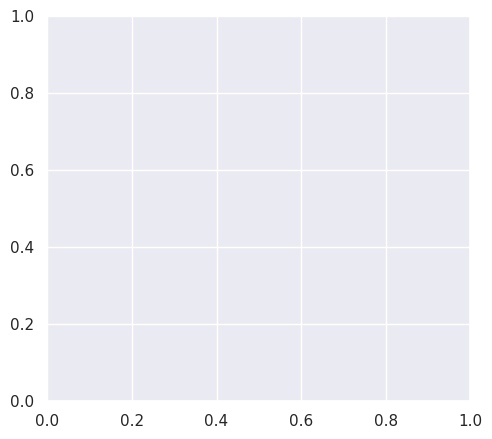

In [57]:
# Recupere as curvas de treinamento
history = model_result.history

# Gere gráficos de perda e acurácia
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.legend()
plt.title('Loss evolution')

plt.subplot(1, 2, 2)
plt.plot(history.history['mae'], label='Train MAE')
plt.plot(history.history['val_mae'], label='Validation MAE')
plt.legend()
plt.title('MAE evolution')

plt.show()

**Plota o loss e métrica com o modelo treinado com os melhores hiperparâmetros**

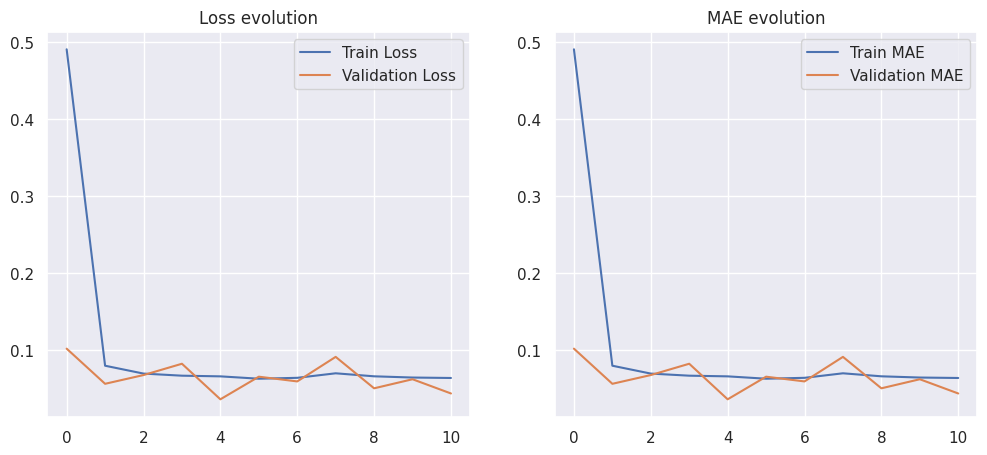

In [58]:
# Gere gráficos de perda e acurácia
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history_dict['loss'], label='Train Loss')
plt.plot(history_dict['val_loss'], label='Validation Loss')
plt.legend()
plt.title('Loss evolution')

plt.subplot(1, 2, 2)
plt.plot(history_dict['mae'], label='Train MAE')
plt.plot(history_dict['val_mae'], label='Validation MAE')
plt.legend()
plt.title('MAE evolution')

plt.show()

In [52]:
testt = keras_clf.get_params().keys()
testt

dict_keys(['model', 'build_fn', 'warm_start', 'random_state', 'optimizer', 'loss', 'metrics', 'batch_size', 'validation_batch_size', 'verbose', 'callbacks', 'validation_split', 'shuffle', 'run_eagerly', 'epochs', 'dropout', 'hidden_layer_sizes', 'learning_rate'])

43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
[0.40400863 0.41632786 0.41434857 ... 0.38115394 0.3970846  0.39194456]
MSE: 0.002146028705615603
MAE Normalizado: 0.036465356647627685 - MAE Normal: 112.27334720514675


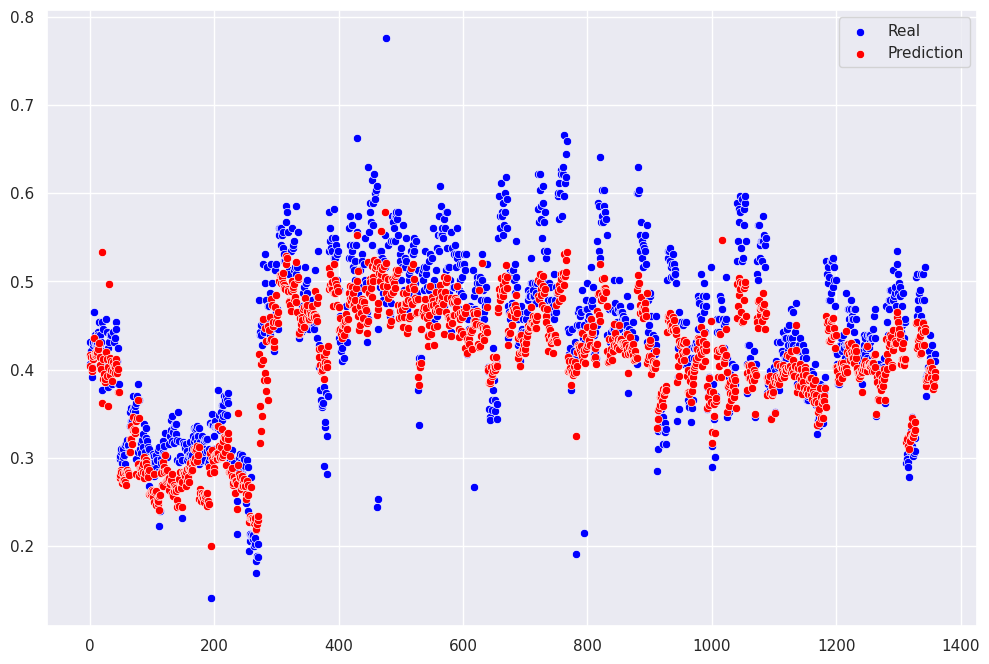

In [59]:
pred_val = model.predict(X_val)
pred_inv_val = np.array(ysc.inverse_transform(pred_val))
print(pred_val.reshape(-1))
print("MSE:", mean_squared_error(y_val, pred_val))
print("MAE Normalizado:", mean_absolute_error(y_val, pred_val), "- MAE Normal:", mean_absolute_error(y_val, pred_inv_val))
plt.figure(figsize=(12,8))
sns.scatterplot(y_val.reshape(-1), color='blue', label='Real')
sns.scatterplot(pred_val.reshape(-1), color='red', label='Prediction')
plt.legend()
plt.show()

675/675 ━━━━━━━━━━━━━━━━━━━━ 1s 762us/step
[ 0.43534547  0.45784074  0.4396262  ... -0.3162169  -0.3253525
 -0.33313215]
MSE: 0.07694180750412007
MAE: 0.2087096226420146


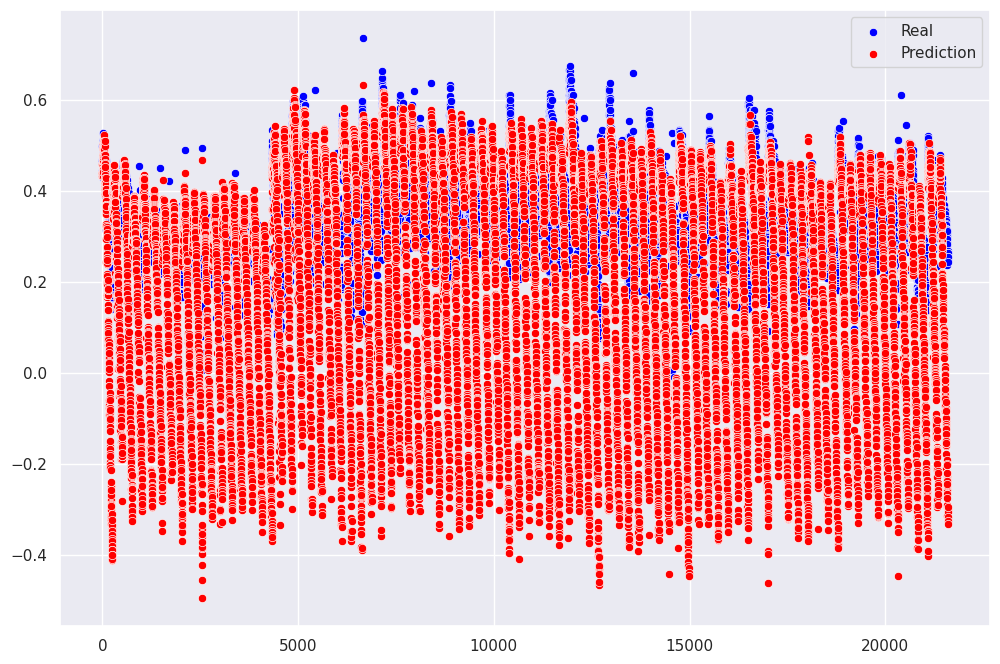

In [60]:
pred = model.predict(X_test)
print(pred.reshape(-1))
print("MSE:", mean_squared_error(y_test, pred))
print("MAE:", mean_absolute_error(y_test, pred))
plt.figure(figsize=(12,8))
sns.scatterplot(y_test.reshape(-1), color='blue', label='Real')
sns.scatterplot(pred.reshape(-1), color='red', label='Prediction')
plt.legend()
plt.show()

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 982us/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 910us/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 936us/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 988us/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


/tmp/ipykernel_3271417/2878491821.py:24: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(1, 2, figsize=(12, 8))


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 941us/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 980us/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 978us/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 926us/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
8/8 ━━━━

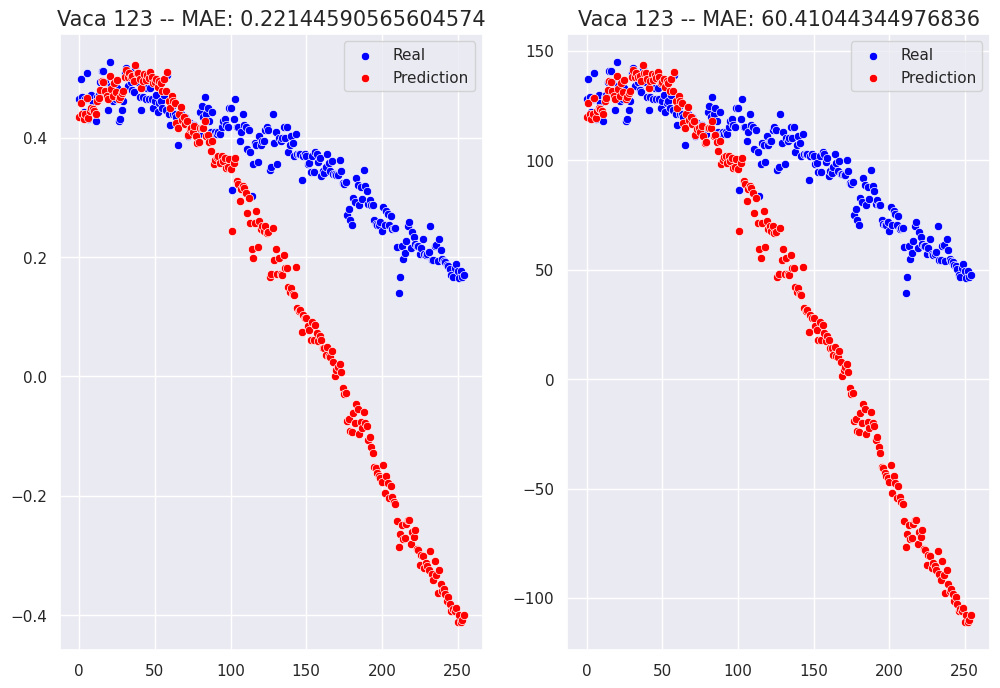

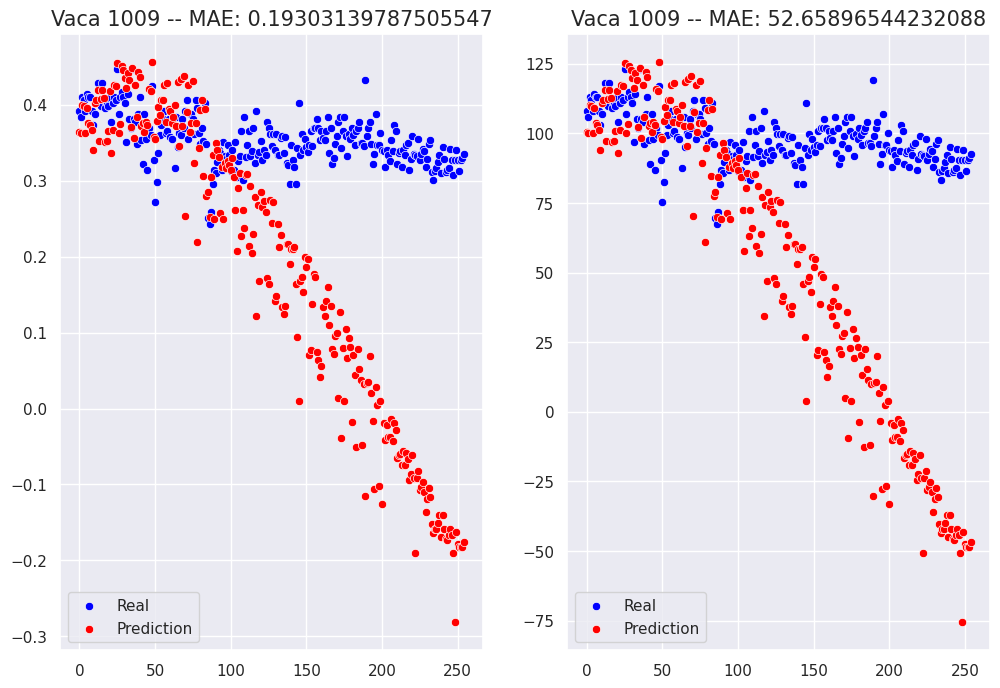

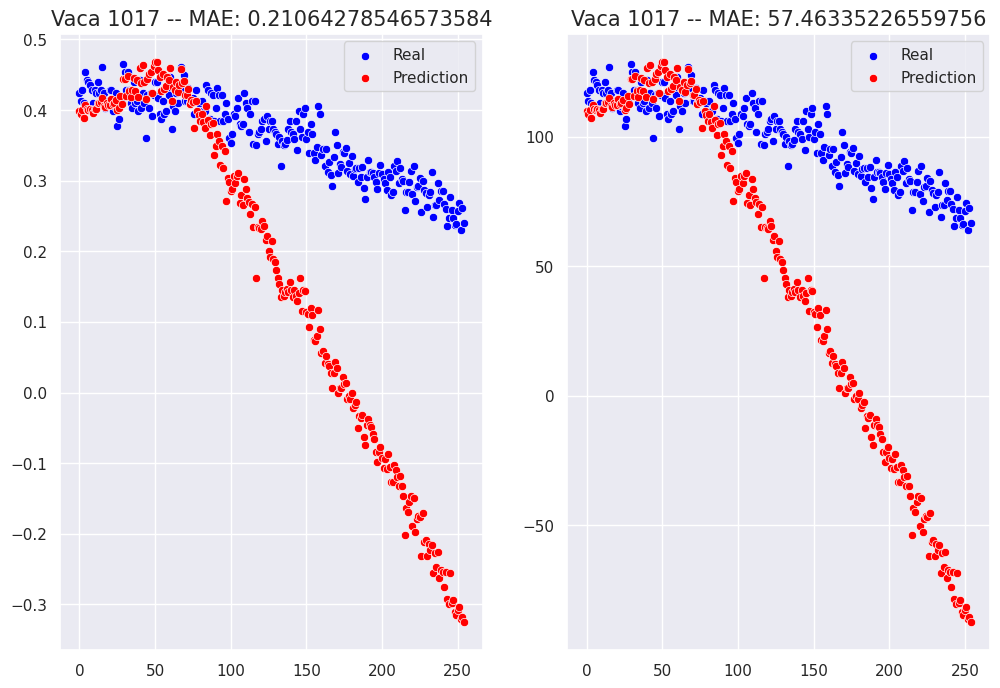

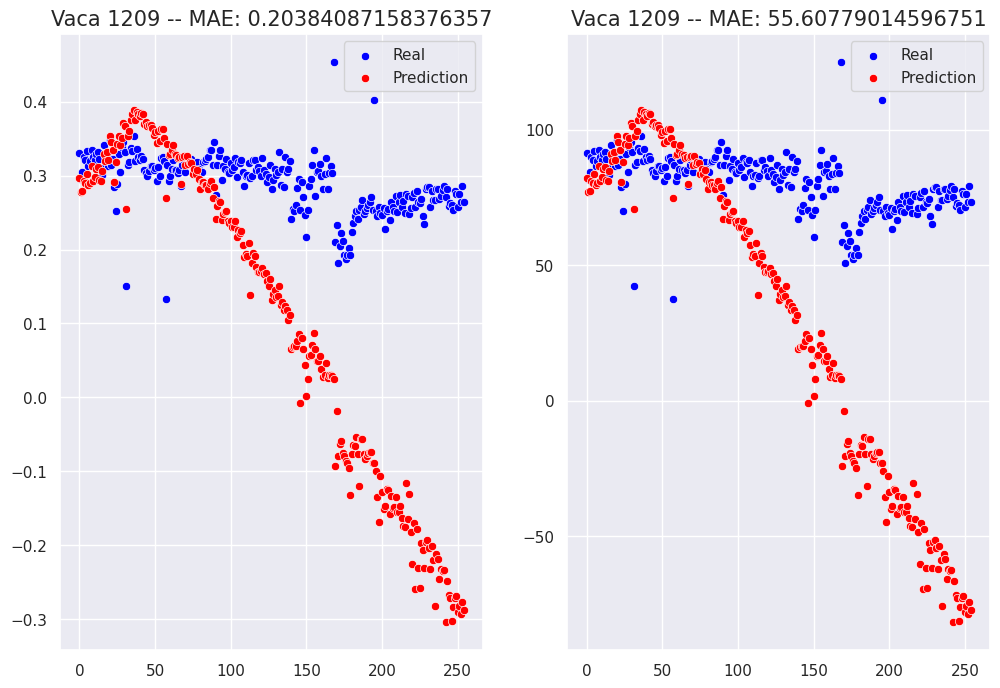

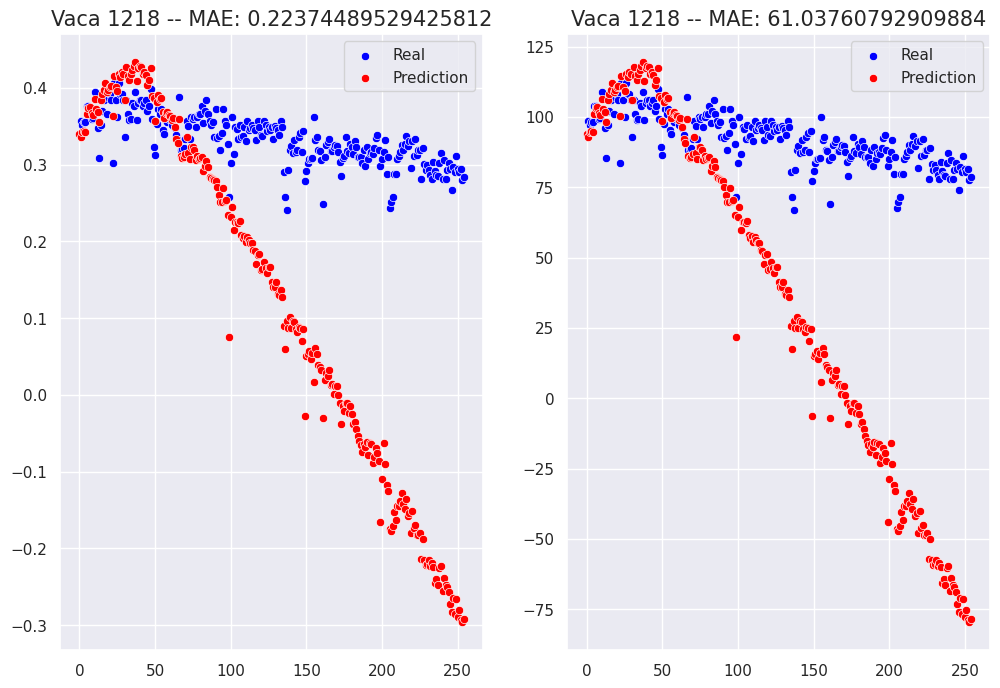

...

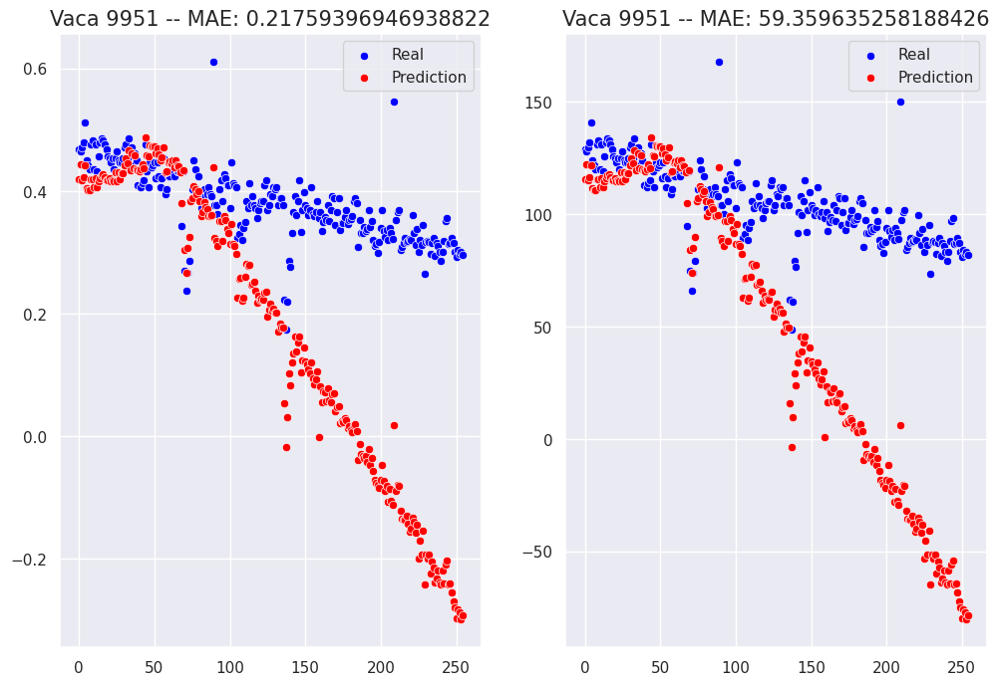

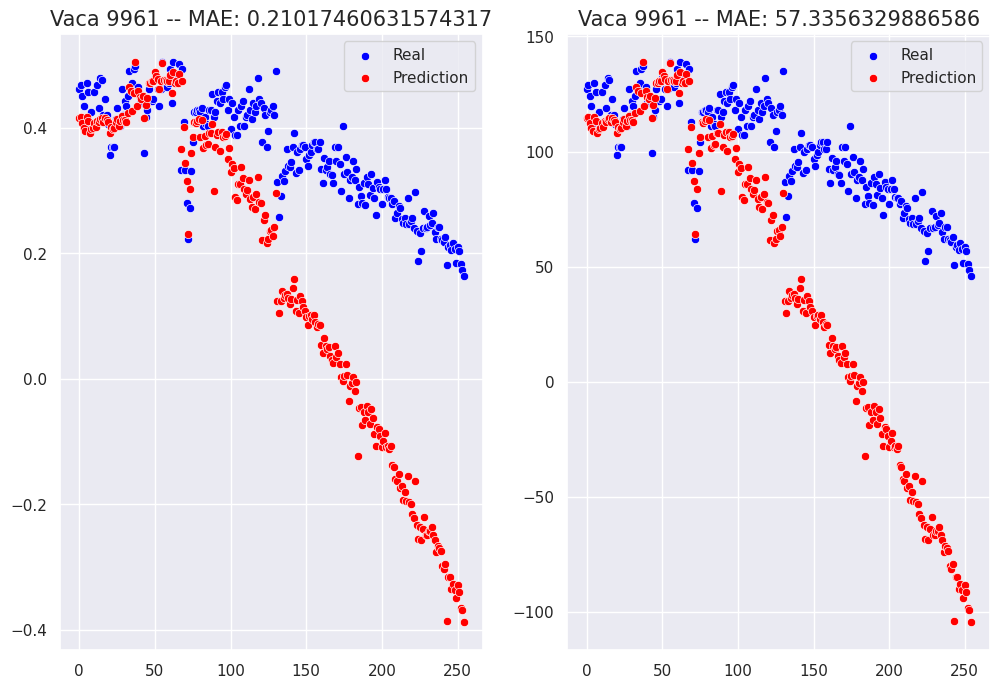

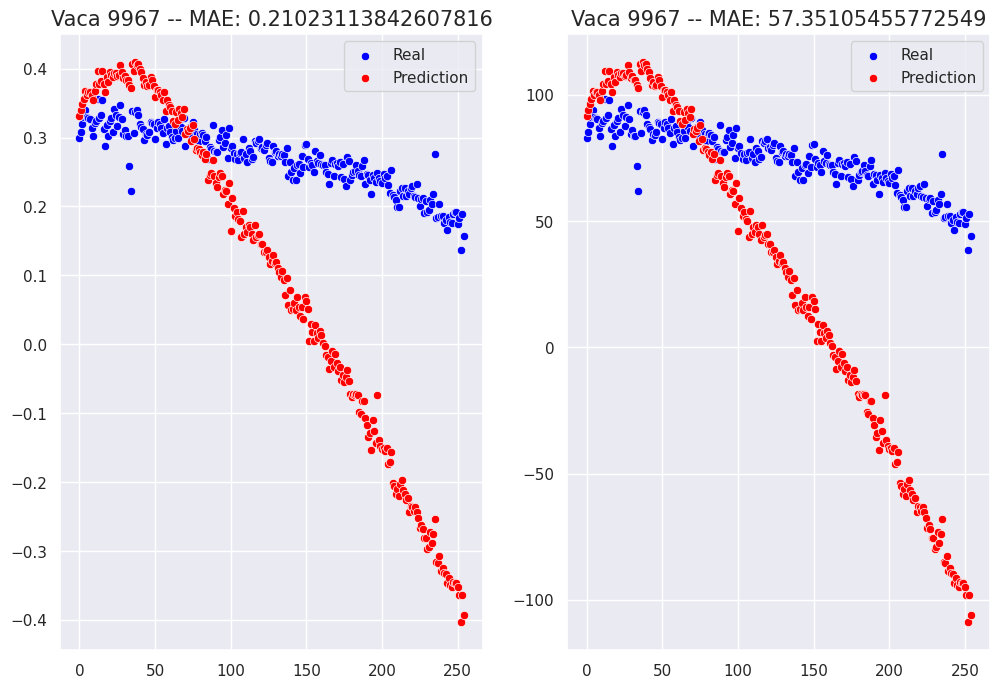

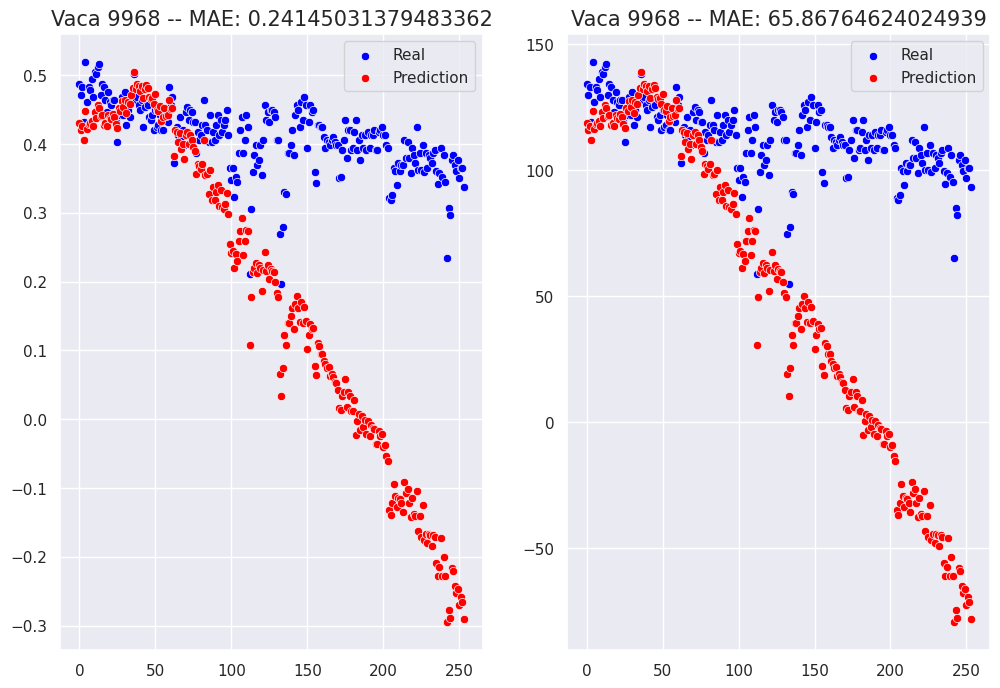

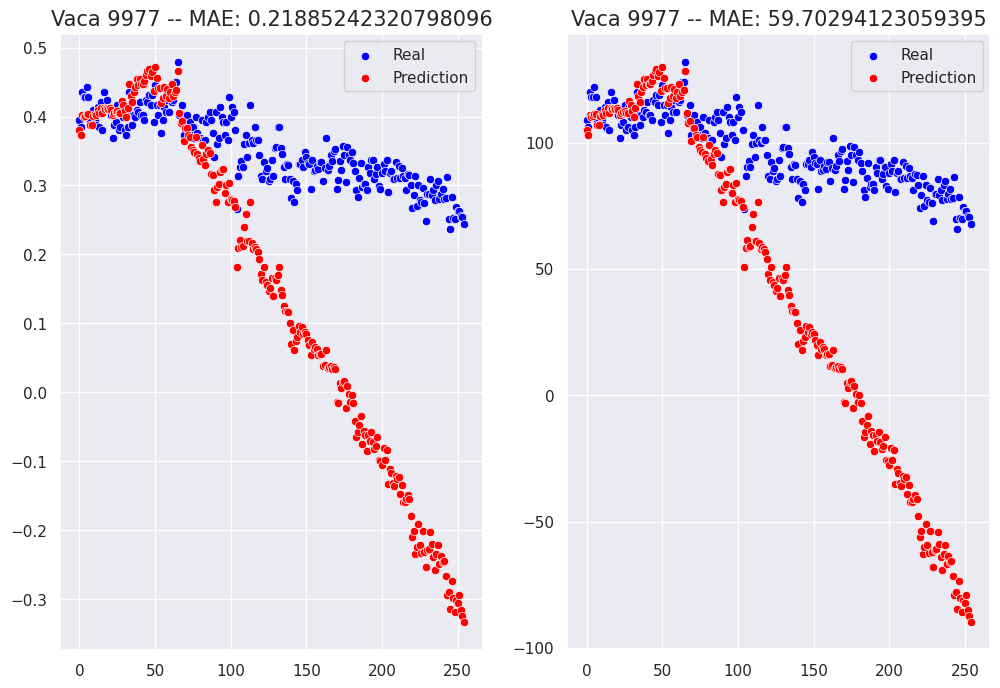

In [61]:
save_dir = 'images/outputMLP'

index_aux = 0
janela_entre_vacas = 0
for vaca in codigos_vacas:
    xs = []
    ys = []
    comprimento_serie = len(df_milk[df_milk["AnEar"]==vaca])
    janela_entre_vacas += comprimento_serie - tam_janela
    #print(janela_entre_vacas)
    for i in range(index_aux, janela_entre_vacas, 1):
        xs.append(X_test[i])
        ys.append(y_test[i])

    ys = np.array(ys)
    xs = np.array(xs)
    #preds = grid_result.predict(xs)
    preds = model.predict(xs)
    pred = np.array(ysc.inverse_transform(preds))

    #print("YS:", ys)
    #print("PRED:", preds)

    fig, axes = plt.subplots(1, 2, figsize=(12, 8))
    sns.scatterplot(ys.reshape(-1), color='blue', label='Real', ax=axes[0])
    sns.scatterplot(preds.reshape(-1), color='red', label='Prediction', ax=axes[0])
    axes[0].set_title(f'Vaca {vaca} -- MAE: {mean_absolute_error(ys, preds)}', fontsize=15)
    #axes[0].set_title(f'Vaca {vaca} -- MAE: {mean_squared_error(ys, preds)}', fontsize=15)

    ys = ysc.inverse_transform(ys)
    sns.scatterplot(ys.reshape(-1), color='blue', label='Real', ax=axes[1])
    sns.scatterplot(pred.reshape(-1), color='red', label='Prediction', ax=axes[1])
    axes[1].set_title(f'Vaca {vaca} -- MAE: {mean_absolute_error(ys, pred)}', fontsize=15)
    #axes[1].set_title(f'Vaca {vaca} -- MAE: {mean_squared_error(ys, pred)}', fontsize=15)
    
    index_aux = janela_entre_vacas
    
    plt.plot()
    
    # Salvando o gráfico
    # Se não existir o diretório, cria um
    if not os.path.exists(save_dir):
        os.makedirs(save_dir)
    fig.savefig(os.path.join(save_dir, f'vaca_{vaca}.png'))